<a href="https://colab.research.google.com/github/swilsonmfc/anomaly/blob/master/MachineLearningClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning Process


# Classification
* Low code approach to rapid prototyping supervised machine learning
* Highlight key steps in machine learning process
* How do we assign a category to a set of data?
  * Fraud / Not Fraud
  * Sick / Heathy
  * Churn / Not Churn
  * Imagenet
  * Text / Sentiment + -

# Setup

In [1]:
pip install pycaret

     |████████████████████████████████| 256kB 2.8MB/s 
     |████████████████████████████████| 65.9MB 59kB/s 
     |████████████████████████████████| 61kB 7.9MB/s 
     |████████████████████████████████| 12.4MB 34.1MB/s 
     |████████████████████████████████| 1.2MB 39.5MB/s 
     |████████████████████████████████| 102kB 12.1MB/s 
     |████████████████████████████████| 266kB 45.7MB/s 
     |████████████████████████████████| 1.6MB 38.5MB/s 
     |████████████████████████████████| 6.8MB 45.7MB/s 
     |████████████████████████████████| 266kB 34.4MB/s 
     |████████████████████████████████| 235kB 43.5MB/s 
     |████████████████████████████████| 153kB 54.5MB/s 
     |████████████████████████████████| 163kB 44.1MB/s 
     |████████████████████████████████| 51kB 6.3MB/s 
     |████████████████████████████████| 6.0MB 42.8MB/s 
     |████████████████████████████████| 81kB 9.2MB/s 
     |████████████████████████████████| 1.1MB 41.8MB/s 
  Installing build dependencies ... done
  Getting requ

In [2]:
pip install pandas-profiling==2.8

In [19]:
pip install shap

     |████████████████████████████████| 276kB 2.8MB/s 
  Created wheel for shap: filename=shap-0.35.0-cp36-cp36m-linux_x86_64.whl size=394119 sha256=76abbfe3825535f338064bd8014f55297f33822cbd777051e786022010a3fc2b
  Stored in directory: /root/.cache/pip/wheels/e7/f7/0f/b57055080cf8894906b3bd3616d2fc2bfd0b12d5161bcb24ac
Successfully built shap


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from pycaret.datasets import get_data
from pycaret.classification import *

import pandas_profiling as pp

from matplotlib.colors import ListedColormap
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import load_iris
from sklearn.datasets import make_blobs
from sklearn.metrics import accuracy_score 
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

import ipywidgets as widgets
from ipywidgets import interact
from ipywidgets import interactive

import random

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [4]:
pp.__version__

'2.8.0'

# Machine Learning Process
* Data Collection
* Exploratory Data Analysis
* Data Preparation
* Model
* Training
* Tuning
* Prediction
* Finalize
* Deploy

# Data Collection

A data frame with 1070 observations on the following 18 variables.
* Purchase: A factor with levels CH and MM indicating whether the customer purchased Citrus Hill or Minute Maid Orange Juice
* WeekofPurchase: Week of purchase
* StoreID: Store ID
* PriceCH: Price charged for CH
* PriceMM: Price charged for MM
* DiscCH: Discount offered for CH
* DiscMM: Discount offered for MM
* SpecialCH: Indicator of special on CH
* SpecialMM: Indicator of special on MM
* LoyalCH: Customer brand loyalty for CH
* SalePriceMM: Sale price for MM
* SalePriceCH: Sale price for CH
* PriceDiff: Sale price of MM less sale price of CH
* Store7: A factor with levels No and Yes indicating whether the sale is at Store 7
* PctDiscMM: Percentage discount for MM
* PctDiscCH: Percentage discount for CH
* ListPriceDiff: List price of MM less list price of CH
* STORE: Which of 5 possible stores the sale occured at

In [5]:
df = get_data('juice')

,Id,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,PctDiscMM,PctDiscCH,ListPriceDiff,STORE
0,1,CH,237,1,1.75,1.99,0.00,0.0,0,0,0.500000,1.99,1.75,0.24,No,0.000000,0.000000,0.24,1
1,2,CH,239,1,1.75,1.99,0.00,0.3,0,1,0.600000,1.69,1.75,-0.06,No,0.150754,0.000000,0.24,1
2,3,CH,245,1,1.86,2.09,0.17,0.0,0,0,0.680000,2.09,1.69,0.40,No,0.000000,0.091398,0.23,1
3,4,MM,227,1,1.69,1.69,0.00,0.0,0,0,0.400000,1.69,1.69,0.00,No,0.000000,0.000000,0.00,1
4,5,CH,228,7,1.69,1.69,0.00,0.0,0,0,0.956535,1.69,1.69,0.00,Yes,0.000000,0.000000,0.00,0


# EDA

In [6]:
profile = pp.ProfileReport(df, title="Pandas Profiling Report")
profile

# Data Preparation

In [7]:
experiment = setup(df, target='Purchase')

Setup Succesfully Completed!


,Description,Value
0,session_id,7035
1,Target Type,Binary
2,Label Encoded,"CH: 0, MM: 1"
3,Original Data,"(1070, 19)"
4,Missing Values,False
5,Numeric Features,13
6,Categorical Features,5
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


# Models
* We have a goal that we want to learn / optimize
* We need a loss function that will approximate our goal
* We need an algorithm to minimize our loss given our data
  * There are numerous algorithms 
  * They vary in their performance and explainability
* With sufficient resources we could try a wide variety of hypotheses 
* With more limited resources (compute / time) we tend to use robust algorithms that tend to perform well across many datasets
  * Logistic Regression (Linear Model)
  * Random Forest (Ensemble of Decision Trees)
  * Boosting (Incrementally Fit Biased Decision Trees to Successive Errors)

## Loss
* Accuracy
  * Measures the number of correctly classified items / total items
  * Strength - Easy to understand and communicate
  * Weakness - Misleading when classes aren't balanced (fraud use case)
* AUC
  * Area under curve
  * Sort items according to score
  ![alt text](https://developers.google.com/machine-learning/crash-course/images/AUCPredictionsRanked.svg)
  * AUC is the probability we have a positive example to the right of a negative example
* Precision
  * If we call it a positive, how many times are we correct?
  * Number of True Positives / (True Positives + False Positives)
* Recall
  * How many positives did we identify?
  * Number of True Positives / All Positives
* F Beta
  * $\frac{(1 + beta^2) * (Precision + Recall)}{beta^2 * Precision + Recall}$
  * F1 = Harmonic mean balances precision and recall
  * Generalized (F-Beta) allows you to push more emphasis on precision or recall
  * Smaller Beta favors precision, larger Beta favors recall
* Kappa
  * Measures the agreement between two classifiers 
  * For ML, this is the predicted value vs actual
  * 1.0 Perfect agreement
  * 0.0 No agreement

## Compare

In [8]:
compare_models(blacklist=['xgboost'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
0,Ridge Classifier,0.8343,0.0000,0.7566,0.8108,0.7809,0.6480,0.6509,0.0088
1,Logistic Regression,0.8330,0.9006,0.7395,0.8184,0.7755,0.6431,0.6465,0.0503
2,Linear Discriminant Analysis,0.8316,0.9005,0.7564,0.8066,0.7780,0.6428,0.6464,0.0092
3,Gradient Boosting Classifier,0.8182,0.9047,0.7669,0.7779,0.7689,0.6194,0.6231,0.1616
4,Ada Boost Classifier,0.8169,0.8967,0.7428,0.7887,0.7595,0.6124,0.6184,0.1028
5,CatBoost Classifier,0.8169,0.8993,0.7531,0.7796,0.7633,0.6143,0.6175,1.3870
6,Light Gradient Boosting Machine,0.7902,0.8921,0.7361,0.7403,0.7333,0.5609,0.5658,0.0676
7,Decision Tree Classifier,0.7795,0.7699,0.7118,0.7238,0.7152,0.5356,0.5380,0.0085
8,Random Forest Classifier,0.7782,0.8405,0.6745,0.7450,0.7041,0.5275,0.5326,0.1134
9,Quadratic Discriminant Analysis,0.7647,0.8253,0.7021,0.7025,0.6958,0.5054,0.5113,0.0082


RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=7035,
                solver='auto', tol=0.001)

## Classifiers
  * Proximity
    * KNN
  * Linear (Linear in Parameters)
    * Linear Discriminant Analysis
    * Logistics Regression
    * Ridge Classifier
    * SVM
  * Tree Based 
    * Decision Tree
    * Random Forest
    * Extra Trees
  * Boosting
    * Gradient Boosting
    * AdaBoost
    * LightGBM
    * CatBoost
    * XGBoost (Not used here)

# Training Models
* Important considerations when training a model


## KNN
* K-Nearest Neighbors
* Identify the k-closest neighbors
* Assign the mode class 

In [9]:
b_x, b_y = make_blobs(n_samples = 150, n_features = 2, centers = [(-.25, -.25), (.25, .25)])

In [12]:
@interact
def plot_knn(n_neighbors=(1, len(b_x))):
  h = .02 

  cmap_light = ListedColormap(['orange', 'cyan', 'cornflowerblue'])
  cmap_bold = ListedColormap(['darkorange', 'c', 'darkblue'])

  clf = KNeighborsClassifier(n_neighbors, weights='distance')
  clf.fit(b_x, b_y)

  x_min, x_max = b_x[:, 0].min() - 1, b_x[:, 0].max() + 1
  y_min, y_max = b_x[:, 1].min() - 1, b_x[:, 1].max() + 1
  xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                        np.arange(y_min, y_max, h))
  Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
  Z = Z.reshape(xx.shape)

  plt.figure(figsize=(10, 8))
  plt.pcolormesh(xx, yy, Z, cmap=cmap_light)
  plt.scatter(b_x[:, 0], b_x[:, 1], c=b_y, cmap=cmap_bold, edgecolor='black', s=20)
  plt.xlim(xx.min(), xx.max())
  plt.ylim(yy.min(), yy.max())
  plt.title(f'KNN Classification (k = {n_neighbors})')

  plt.show()

interactive(children=(IntSlider(value=75, description='n_neighbors', max=150, min=1), Output()), _dom_classes=…

## Bias & Variance
![alt text](https://media-exp1.licdn.com/dms/image/C5612AQHQ4RWFA1BO6Q/article-cover_image-shrink_600_2000/0?e=1598486400&v=beta&t=8HbG5PX-PgvJAJ5Gn-aT0LbBBqG7sEZb72gbWWWzD30)
* Model Complexity
  * At k == 1 each point is it's only neighbor
  * As k increases from 1, we use more neighbors, more complexity 
  * Some of the neighbors are close others are far away
  * As k goes to length of data, we have fewer neighbors, less complexity
  * At k == length of data we predict the mode
* Variance - Overfitting
  * Large gap between training error and test error
  * We nail the data we learn from, but doesn't generalize to new points
  * More data or less model complexity
* Bias - Underfitting
  * Large gap between theoretical accuracy and 
model accuracy
  * Our training and test data are close, but far away from ideal
  * More features or more model complexity
* Can we have both high variance and high bias?

## Holdout Data

Text(0.5, 0, 'Neighbors')

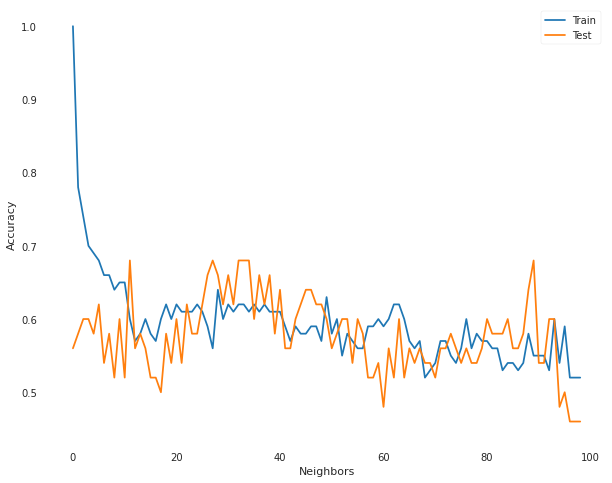

In [13]:
X = b_x
y = b_y

acc_train = []
acc_test  = []

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=50, random_state=50)

for k in range(1, len(X_train)):
  knn_model = KNeighborsClassifier(n_neighbors = k)
  knn_model.fit(X_train, y_train)

  y_hat_train = knn_model.predict(X_train)
  y_hat_test  = knn_model.predict(X_test)

  acc_train.append(accuracy_score(y_train, y_hat_train))
  acc_test.append (accuracy_score(y_test,  y_hat_test)) 

plt.figure(figsize=(10, 8))
plt.plot(acc_train, label="Train")
plt.plot(acc_test, label="Test")
plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Neighbors')

## Cross-Fold Validation
* What's a good way to split training data?
* Random and without replacement
* But, we can still get unlucky with a split that trains great, and generalizes poorly
* Minimize being unlucky with K Cross-Fold validation

![alt text](https://www.researchgate.net/profile/Mingchao_Li/publication/331209203/figure/fig2/AS:728070977748994@1550597056956/K-fold-cross-validation-method.png)

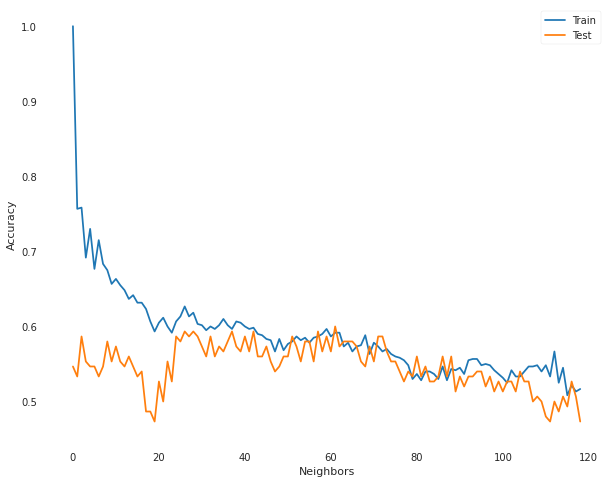

In [15]:
X = b_x
y = b_y

acc_train = []
acc_test  = []

for k in range(1, len(X_train)):
  folds = 5
  run_train, run_test = 0, 0
  kf = KFold(n_splits=folds, random_state=1200, shuffle=True)
  for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    knn_model = KNeighborsClassifier(n_neighbors = k)
    knn_model.fit(X_train, y_train)

    y_hat_train = knn_model.predict(X_train)
    y_hat_test  = knn_model.predict(X_test)

    run_train += accuracy_score(y_train, y_hat_train)
    run_test  += accuracy_score(y_test,  y_hat_test)
  acc_train.append(run_train / folds)
  acc_test.append (run_test / folds) 

plt.figure(figsize=(10, 8))
plt.plot(acc_train, label="Train")
plt.plot(acc_test, label="Test")
plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Neighbors');

# Training

## KNN

In [16]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6933,0.7399,0.5517,0.6154,0.5818,0.3408,0.3421
1,0.6267,0.7013,0.4828,0.5185,0.5000,0.2027,0.2031
2,0.7867,0.7984,0.5862,0.8095,0.6800,0.5261,0.5415
3,0.7733,0.8006,0.5862,0.7727,0.6667,0.4998,0.5108
4,0.7200,0.7706,0.6552,0.6333,0.6441,0.4134,0.4136
5,0.7067,0.6904,0.5862,0.6296,0.6071,0.3736,0.3742
6,0.7067,0.7519,0.6000,0.6429,0.6207,0.3820,0.3826
7,0.6933,0.7826,0.5667,0.6296,0.5965,0.3503,0.3515
8,0.7703,0.7931,0.6552,0.7308,0.6909,0.5090,0.5109
9,0.7432,0.7548,0.5862,0.7083,0.6415,0.4443,0.4491


## Catboost

In [17]:
cat = create_model('catboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8133,0.9055,0.7931,0.7419,0.7667,0.6114,0.6123
1,0.7333,0.8643,0.7586,0.6286,0.6875,0.4585,0.4647
2,0.8400,0.9115,0.6897,0.8696,0.7692,0.6493,0.6595
3,0.8133,0.9288,0.6897,0.8000,0.7407,0.5962,0.6002
4,0.8133,0.8913,0.7241,0.7778,0.7500,0.6014,0.6023
5,0.8533,0.9130,0.7931,0.8214,0.8070,0.6888,0.6891
6,0.8133,0.8648,0.8333,0.7353,0.7812,0.6196,0.6233
7,0.8133,0.8833,0.7667,0.7667,0.7667,0.6111,0.6111
8,0.8378,0.9065,0.7586,0.8148,0.7857,0.6555,0.6566
9,0.8378,0.9234,0.7241,0.8400,0.7778,0.6512,0.6557


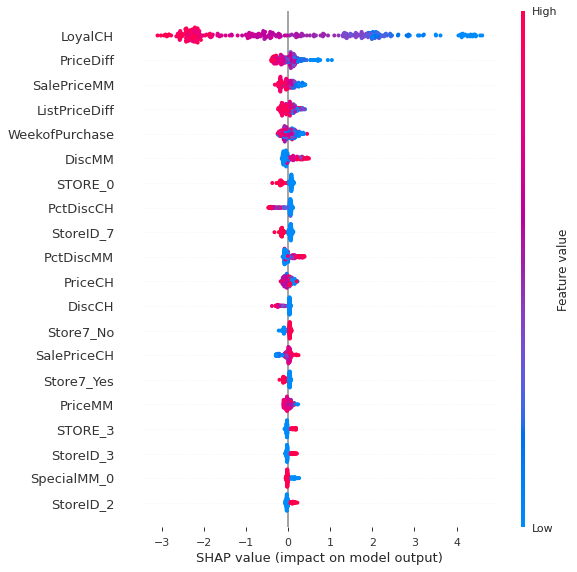

In [20]:
interpret_model(estimator=cat)

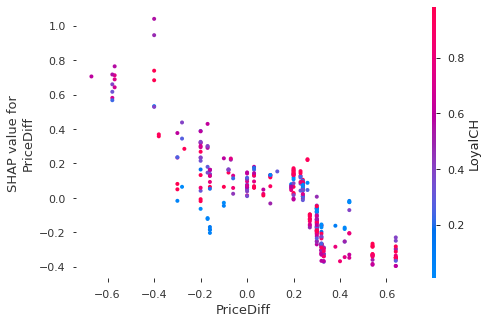

In [21]:
interpret_model(cat, plot = 'correlation', feature = 'PriceDiff', )

## Linear Regression

In [22]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8267,0.9123,0.7586,0.7857,0.7719,0.6322,0.6325
1,0.8000,0.8981,0.7586,0.7333,0.7458,0.5810,0.5812
2,0.8533,0.8973,0.7241,0.8750,0.7925,0.6806,0.6879
3,0.8533,0.9303,0.7586,0.8462,0.8000,0.6848,0.6873
4,0.8000,0.8681,0.6552,0.7917,0.7170,0.5645,0.5705
5,0.8133,0.8906,0.6552,0.8261,0.7308,0.5908,0.6001
6,0.8000,0.8559,0.7667,0.7419,0.7541,0.5856,0.5859
7,0.8533,0.9048,0.7667,0.8519,0.8070,0.6893,0.6918
8,0.8649,0.9295,0.7931,0.8519,0.8214,0.7130,0.7141
9,0.8649,0.9188,0.7586,0.8800,0.8148,0.7093,0.7142


In [23]:
evaluate_model(estimator=lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# Tuning
* Take model and explore hyperparameter tuning / options
* Tuned model performed a little worse on the objective 
* The search space had 10 iterations, increase n_iterations to find better combination
* We'll use the original model (saving time)

In [25]:
cat_tuned = tune_model(cat)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8000,0.8958,0.7586,0.7333,0.7458,0.5810,0.5812
1,0.7467,0.8823,0.7931,0.6389,0.7077,0.4887,0.4976
2,0.8533,0.9055,0.7241,0.8750,0.7925,0.6806,0.6879
3,0.8667,0.9213,0.7931,0.8519,0.8214,0.7153,0.7164
4,0.8267,0.8838,0.7586,0.7857,0.7719,0.6322,0.6325
5,0.8400,0.9198,0.7931,0.7931,0.7931,0.6627,0.6627
6,0.8133,0.8656,0.8000,0.7500,0.7742,0.6154,0.6163
7,0.8267,0.9056,0.7667,0.7931,0.7797,0.6369,0.6371
8,0.8514,0.9172,0.7931,0.8214,0.8070,0.6862,0.6865
9,0.8514,0.9364,0.7586,0.8462,0.8000,0.6823,0.6849


# Prediction
* How did we do on the holdout dataset?
* Original model did a little better - stick with it

In [26]:
pred_holdout_cat = predict_model(cat)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.8043,0.8919,0.76,0.7422,0.751,0.5899,0.59


In [27]:
pred_holdout_cat = predict_model(cat_tuned)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.8261,0.8949,0.8,0.7634,0.7813,0.6371,0.6375


## Interpret

In [28]:
interpret_model(cat, plot = 'reason', observation=0)

In [29]:
interpret_model(cat, plot = 'reason')

# Finalize
* We trained and evaluated on the train / test splits
* For a final model (deployed) use all the data

In [30]:
final_cat = finalize_model(estimator=cat)

# Deploy
* Store Pickle on S3
* Build into Docker
* Serve from EC2 / EKS / ECS 

# New Data

In [31]:
df.head()

,Id,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,PctDiscMM,PctDiscCH,ListPriceDiff,STORE
0,1,CH,237,1,1.75,1.99,0.00,0.0,0,0,0.500000,1.99,1.75,0.24,No,0.000000,0.000000,0.24,1
1,2,CH,239,1,1.75,1.99,0.00,0.3,0,1,0.600000,1.69,1.75,-0.06,No,0.150754,0.000000,0.24,1
2,3,CH,245,1,1.86,2.09,0.17,0.0,0,0,0.680000,2.09,1.69,0.40,No,0.000000,0.091398,0.23,1
3,4,MM,227,1,1.69,1.69,0.00,0.0,0,0,0.400000,1.69,1.69,0.00,No,0.000000,0.000000,0.00,1
4,5,CH,228,7,1.69,1.69,0.00,0.0,0,0,0.956535,1.69,1.69,0.00,Yes,0.000000,0.000000,0.00,0


In [32]:
df[['PriceCH', 'SalePriceCH', 'DiscCH', 'PctDiscCH']].head()

,PriceCH,SalePriceCH,DiscCH,PctDiscCH
0,1.75,1.75,0.00,0.000000
1,1.75,1.75,0.00,0.000000
2,1.86,1.69,0.17,0.091398
3,1.69,1.69,0.00,0.000000
4,1.69,1.69,0.00,0.000000


In [33]:
data = [{
    'WeekofPurchase': 237,	
    'StoreID': 1,	
    'PriceCH': 1.79,	
    'PriceMM': 2.19,
    'DiscCH': 0.00, 
    'DiscMM': 0.00, 
    'SpecialCH': 0,
    'SpecialMM': 1,
    'LoyalCH': .5,
    'SalePriceMM': 2.19,
    'SalePriceCH': 1.79,
    'PriceDiff': 0.4,
    'Store7': 0,
    'PctDiscMM': 0.0,
    'PctDiscCH': 0.0,
    'ListPriceDiff': 0.4,
    'STORE': 1
}]
predict_model(cat, data = pd.DataFrame(data)) 

,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,PctDiscMM,PctDiscCH,ListPriceDiff,STORE,Label,Score
0,237,1,1.79,2.19,0.0,0.0,0,1,0.5,2.19,1.79,0.4,0,0.0,0.0,0.4,1,0,0.2267
